<a href="https://colab.research.google.com/github/escuccim/pytorch-face-autoencoder/blob/master/eas7_faces_gan_vae.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

After trying to train the GAN and the Autoencoder at the same time and having no luck I decided to try to train the GAN from scratch the make sure it was working. Now that I finally have it working, I think it might make more sense to train the GAN first - with only the Decoder and the Discriminator - and then attempt to add the Encoder once that is working. This might work better since then the Encoder would be trying to format the noise to make it generate the desired output.

In [1]:
import torch
import torchvision
from torch import nn
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt, colors
%matplotlib inline
import zipfile
import os
import matplotlib.animation as animation
import torchvision.utils as vutils
import numpy as np

from google.colab import auth
auth.authenticate_user()

# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'pneumonia'

!gcloud config set project {project_id}

Updated property [core/project].


To take a quick anonymous survey, run:
  $ gcloud alpha survey



In [2]:
# !gsutil cp gs://{bucket_name}/model_30_trained.pt ./gen_model_1g.pt
!gsutil cp gs://{bucket_name}/model_1g_vae.pt ./model_1g_vae.pt
!gsutil cp gs://{bucket_name}/model_1d_vae.pt ./model_1d_vae.pt

# !gsutil cp gs://{bucket_name}/gen_model_31.pt ./gen_model_1g.pt
# !gsutil cp gs://{bucket_name}/disc_model_31.pt ./disc_model_1g.pt

Copying gs://pneumonia/model_1g_vae.pt...
/ [1 files][221.0 MiB/221.0 MiB]                                                
Operation completed over 1 objects/221.0 MiB.                                    
Copying gs://pneumonia/model_1d_vae.pt...
- [1 files][ 82.5 MiB/ 82.5 MiB]                                                
Operation completed over 1 objects/82.5 MiB.                                     


In [0]:
# if not os.path.exists("celeba-dataset.zip"):
# #   !kaggle datasets download -d jessicali9530/celeba-dataset
#   !gsutil cp gs://{bucket_name}/celeba-dataset.zip ./celeba-dataset.zip
#   zip_ref = zipfile.ZipFile('celeba-dataset.zip', 'r')
#   zip_ref.extractall('data')
#   zip_ref.close()

#   zip_ref = zipfile.ZipFile('data/img_align_celeba.zip', 'r')
#   zip_ref.extractall('data/images')
#   zip_ref.close()
  
# if not os.path.exists("Training_Pictures.zip"):
#   !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
#   zip_ref = zipfile.ZipFile('Training_Pictures.zip', 'r')
#   zip_ref.extractall('data/images')
#   zip_ref.close()  

# if not os.path.exists("imdb_images3.zip"):
#   !gsutil cp gs://{bucket_name}/imdb_images3.zip ./imdb_images3.zip
#   zip_ref = zipfile.ZipFile('imdb_images3.zip', 'r')
#   zip_ref.extractall('data/images')
#   zip_ref.close()

# if not os.path.exists("GWB_200x200_JPEG.zip"):
#   !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/GWB_200x200_JPEG.zip
#   zip_ref = zipfile.ZipFile('GWB_200x200_JPEG.zip', 'r')
#   zip_ref.extractall('data/images')               
#   zip_ref.close()  

In [3]:
if not os.path.exists("celeb_a_good.zip"):
#   !kaggle datasets download -d jessicali9530/celeba-dataset
  !gsutil cp gs://{bucket_name}/celeb_a_good.zip ./celeb_a_good.zip
  zip_ref = zipfile.ZipFile('celeb_a_good.zip', 'r')
  zip_ref.extractall('data/images/celeb_a')
  zip_ref.close()

if not os.path.exists("Training_Pictures.zip"):
  !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
  zip_ref = zipfile.ZipFile('Training_Pictures.zip', 'r')
  zip_ref.extractall('data/images/training')
  zip_ref.close()
  
if not os.path.exists("imdb_crop_good.zip"):  
  !gsutil cp gs://{bucket_name}/imdb_crop_good.zip ./imdb_crop_good.zip
  zip_ref = zipfile.ZipFile('imdb_crop_good.zip', 'r')
  zip_ref.extractall('data/images/imdb')
  zip_ref.close()

if not os.path.exists("crop_part1_good.zip"):
  !gsutil cp gs://{bucket_name}/crop_part1_good.zip ./crop_part1_good.zip
  zip_ref = zipfile.ZipFile('crop_part1_good.zip', 'r')
  zip_ref.extractall('data/images/crop_parta')
  zip_ref.close()   

Copying gs://pneumonia/celeb_a_good.zip...
- [1 files][  1.1 GiB/  1.1 GiB]   74.0 MiB/s                                   
Operation completed over 1 objects/1.1 GiB.                                      
--2019-09-15 06:10:07--  https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
Resolving s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)... 52.95.156.1
Connecting to s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)|52.95.156.1|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 955202 (933K) [application/zip]
Saving to: ‘Training_Pictures.zip’

Training_Pictures.z 100%[===================>] 932.81K  --.-KB/s    in 0.03s   

2019-09-15 06:10:07 (33.6 MB/s) - ‘Training_Pictures.zip’ saved [955202/955202]

Copying gs://pneumonia/imdb_crop_good.zip...
| [1 files][829.6 MiB/829.6 MiB]   73.7 MiB/s                                   
Operation completed over 1 objects/829.6 MiB.                                    
Copying gs://pneumonia/c

In [4]:
# get test data
if not os.path.exists("imdb_crop_test.zip"):
  !gsutil cp gs://{bucket_name}/imdb_crop_test.zip ./imdb_crop_test.zip
  zip_ref = zipfile.ZipFile('imdb_crop_test.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()
  
if not os.path.exists("wiki_images_good.zip"):
  !gsutil cp gs://{bucket_name}/wiki_images_good.zip ./wiki_images_good.zip
  zip_ref = zipfile.ZipFile('wiki_images_good.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()  

# if not os.path.exists("faces94.zip"):
#   !wget https://cswww.essex.ac.uk/mv/allfaces/faces94.zip
#   zip_ref = zipfile.ZipFile('faces94.zip', 'r')
#   zip_ref.extractall('data/test_images')
#   zip_ref.close()
  
# # if not os.path.exists("faces96.zip"):
# #   !wget https://cswww.essex.ac.uk/mv/allfaces/faces96.zip  
# #   zip_ref = zipfile.ZipFile('faces96.zip', 'r')
# #   zip_ref.extractall('data/test_images')
# #   zip_ref.close()

# if not os.path.exists("faces95.zip"):
#   !wget https://cswww.essex.ac.uk/mv/allfaces/faces95.zip  
#   zip_ref = zipfile.ZipFile('faces95.zip', 'r')
#   zip_ref.extractall('data/test_images')
#   zip_ref.close()

# # if not os.path.exists("GWB_200x200_JPEG.zip"):
# #   !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/GWB_200x200_JPEG.zip
# #   zip_ref = zipfile.ZipFile('GWB_200x200_JPEG.zip', 'r')
# #   zip_ref.extractall('data/test_images')
# #   zip_ref.close()  
  
# if not os.path.exists("celeb_a_test.zip"):
#   !gsutil cp gs://{bucket_name}/celeb_a_test.zip ./celeb_a_test.zip
#   zip_ref = zipfile.ZipFile('celeb_a_test.zip', 'r')
#   zip_ref.extractall('data/test_images')
#   zip_ref.close()       
  
if not os.path.exists("wiki_crop_test.zip"):
  !gsutil cp gs://{bucket_name}/wiki_crop_test.zip ./wiki_crop_test.zip
  zip_ref = zipfile.ZipFile('wiki_crop_test.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()     
  

# if not os.path.exists("crop_part1_test.zip"):
#   !gsutil cp gs://{bucket_name}/crop_part1_test.zip ./crop_part1_test.zip
#   zip_ref = zipfile.ZipFile('crop_part1_test.zip', 'r')
#   zip_ref.extractall('data/test_images')
#   zip_ref.close()     

Copying gs://pneumonia/imdb_crop_test.zip...
/ [1 files][216.8 MiB/216.8 MiB]                                                
Operation completed over 1 objects/216.8 MiB.                                    
Copying gs://pneumonia/wiki_images_good.zip...
- [1 files][ 94.7 MiB/ 94.7 MiB]                                                
Operation completed over 1 objects/94.7 MiB.                                     
Copying gs://pneumonia/wiki_crop_test.zip...
/ [1 files][ 27.5 MiB/ 27.5 MiB]                                                
Operation completed over 1 objects/27.5 MiB.                                     


In [0]:
# Root directory for dataset
dataroot = "data/images"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 48

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 128

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 512

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

In [0]:
BATCH_SIZE = batch_size
data_path = "data/images"

transform = torchvision.transforms.Compose(
    [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
      torchvision.transforms.RandomApply([
        torchvision.transforms.RandomAffine(degrees=5, translate=(0.075,0.075), scale=(0.9,1.15), shear=4, resample=False, fillcolor=0),        
      ], 0.7),
      torchvision.transforms.RandomResizedCrop((image_size,image_size), scale=(0.8, 1.20)),
      torchvision.transforms.ToTensor(),
     torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

transform2 = torchvision.transforms.Compose(
    [torchvision.transforms.RandomResizedCrop((image_size,image_size), scale=(0.95, 1.05)),
      torchvision.transforms.ToTensor(),
     torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

train_dataset = torchvision.datasets.ImageFolder(
        root=data_path,
        transform=transform
    )

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=2,
    shuffle=True
)

test_dataset = torchvision.datasets.ImageFolder(
        root="data/test_images",
        transform=transform2
    )

test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=64,
    num_workers=1,
    shuffle=True
)

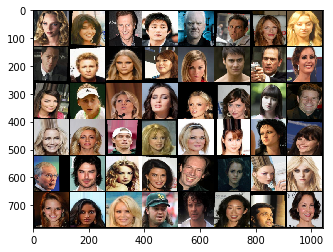

In [0]:
real_batch = next(iter(train_loader))
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

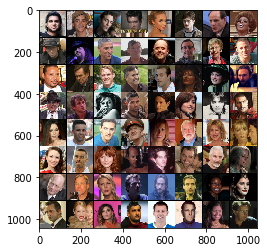

In [0]:
real_batch = next(iter(test_loader))
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

In [0]:
train_dataset

Dataset ImageFolder
    Number of datapoints: 269038
    Root location: data/images

In [0]:
test_dataset

Dataset ImageFolder
    Number of datapoints: 33175
    Root location: data/test_images

In [0]:
def output_size(i, k=3, p=2, s=1, d=1):
    o = (i + 2*p - k - (k-1)*(d-1))/s + 1
    return o
  
output_size(i=64, k=3, p=1)

64.0

### Create Models

In [0]:
epoch_list = []
img_list = []

In [0]:
criterion = torch.nn.BCELoss()
# real_label = 0.90
# fake_label = 0.09
real_label = 0.10
fake_label = 1.0
latent_dim = 512

fixed_noise = torch.randn(16, latent_dim, 1, 1).cuda()
criterion = torch.nn.BCELoss()

def vae_loss(x, x_hat, mu=None, logvar=None, d_faked=None, labels=None, debug=False):
    beta_mse = 20.0
    beta_kld = 0.1
    beta_gloss = 1.0
    
    # MSE for reconstructions
    MSE = nn.functional.mse_loss(x_hat, x)
    MSE *= beta_mse
    
    g_loss = criterion(d_faked, labels)
    g_loss *= beta_gloss
    
    if mu is not None and logvar is not None:
        KLD = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp()) 
        KLD *= (KLD * beta_kld)
    else:
        KLD = torch.zeros(1)
    
    # print out loss info if we want to debug
    if debug:
        print("MSE Loss Raw:", MSE)
        print("MSE Loss Weighted:", MSE * beta_mse)
        print("KLD Loss Raw:", KLD)
        print("KLD Loss Weighted:", KLD * beta_kld)
        if d_faked is not None:
            print("Disc Loss Raw:", g_loss)
            print("Disc Loss Weighted:", g_loss * beta_gloss)
        print("Total Loss (weighted):", total_loss)
    
    return MSE + g_loss + KLD, MSE, KLD, g_loss
  
def disc_loss(labels, logits):
    s_logits = torch.sigmoid(logits)    
    d_loss = criterion(s_logits, labels)
    return d_loss

def disc_loss2(labels, logits):
    d_loss = nn.functional.binary_cross_entropy_with_logits(logits, labels, reduction="mean")
    
    return d_loss    

# Training Loop
def train_gan_2(netD, netG, optimizerD, optimizerG, train_loader=train_loader, test_loader=None, num_epochs=5):
    try:
        print("Starting Training Loop...")
        # For each epoch
        for epoch in range(num_epochs):
            # Lists to keep track of progress
            G_losses = []
            D_losses = []
            iters = 0
            
            MSE_losses = []
            XE_losses = []
            KLD_losses = []
            
            netD.train()
            netG.train()
            
            # For each batch in the dataloader
            for i, data in enumerate(train_loader, 0):

                ############################
                # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
                ###########################
                ## Train with all-real batch
                netD.zero_grad()
                # Format batch
                real_cpu = data[0].to(device)
                b_size = real_cpu.size(0)
                label = torch.full((b_size,), real_label, device=device)
                # Forward pass real batch through D
                output = netD(real_cpu).view(-1)
                # Calculate loss on all-real batch
                errD_real = criterion(output, label + 0.1)
                # Calculate gradients for D in backward pass
                errD_real.backward()
                D_x = output.mean().item()

                ## Train with all-fake batch
                # Generate batch of latent vectors
                noise = torch.randn(b_size, nz, 1, 1, device=device)
                
                # Generate fake image batch with G
                fake, code, logvar = netG(real_cpu)
                
                label.fill_(fake_label)
                # Classify all fake batch with D
                output = netD(fake.detach()).view(-1)
                # Calculate D's loss on the all-fake batch
                errD_fake = criterion(output, label)
                # Calculate the gradients for this batch
                errD_fake.backward()
                D_G_z1 = output.mean().item()
                # Add the gradients from the all-real and all-fake batches
                errD = errD_real + errD_fake
                
                # Update D IF the fake output is not perfect to allow generator to catch up
                # if D_G_z1 < 1.0:
                  # print("Stepping disc.")
                optimizerD.step()

                ############################
                # (2) Update G network: maximize log(D(G(z)))
                ###########################
                netG.zero_grad()
                label.fill_(real_label)  # fake labels are real for generator cost
                # Since we just updated D, perform another forward pass of all-fake batch through D
                output = netD(fake).view(-1)
                
                # Calculate G's loss based on this output
#                 errG = criterion(output, label)
                errG, MSE_loss, KLD_loss, g_loss = vae_loss(real_cpu, fake, mu=code, logvar=logvar, d_faked=output, labels=label)
                
                MSE_losses.append(MSE_loss.item())
                XE_losses.append(g_loss.item())
                KLD_losses.append(KLD_loss.item())
                D_G_z2 = output.mean().item()
            
                # Calculate gradients for G
                errG.backward()
                
                # Update G
                optimizerG.step()

                # Output training stats
                if i % 250 == 0:
                    print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f\tXE Loss: %.4f\tKLD Loss: %.4f\tMSE Loss: %.4f'
                          % (epoch, num_epochs, i, len(train_loader),
                             errD.item(), errG.item(), D_x, D_G_z1, D_G_z2, np.mean(XE_losses), np.mean(KLD_losses), np.mean(MSE_losses)))
                if i % 1000 == 0 and i > 0:
                  with torch.no_grad():
                      fake, _, _ = netG(real_cpu)
                      fake = fake.detach().cpu()
                      fig, ax = plt.subplots(1, 2, figsize=(8,8))
                      ax[0].imshow(np.transpose(vutils.make_grid(fake.detach().cpu()[:4], nrow=2, padding=2, normalize=True),(1,2,0)))
                      ax[1].imshow(np.transpose(vutils.make_grid(real_cpu.detach().cpu()[:4], nrow=2, padding=2, normalize=True),(1,2,0)))
                      plt.show()  

                # Save Losses for plotting later
                G_losses.append(errG.item())
                D_losses.append(errD.item())

                # Check how the generator is doing by saving G's output on fixed_noise
                if (iters % 2000 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
                    with torch.no_grad():
                        fake, _, _ = netG(real_cpu)
                        fake = fake.detach().cpu()
                    img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

                iters += 1

            torch.save(netG.state_dict(), g_save_path)
            torch.save(netD.state_dict(), d_save_path)

            # plot some images
            fig, ax = plt.subplots(1, 2, figsize=(8,8))
            ax[0].imshow(np.transpose(vutils.make_grid(fake.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
            ax[1].imshow(np.transpose(vutils.make_grid(real_cpu.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
            plt.show()    
            
            # run on test dataset
            if test_loader is not None:
                netD.eval()
                netG.eval()
                
                r_outputs = []
                f_outputs = []
                g_losses = []
                d_losses = []
                
                with torch.no_grad():
                    for (inputs, _) in test_loader:
                        # copy the data to GPU
                        inputs = inputs.cuda()
                        
                        b_size = inputs.shape[0]
                        
                        # run the data through the network
                        fake, code, logvar = netG(inputs)
                        r_output = netD(inputs).view(-1)
                        r_outputs.append(r_output.mean().item())
                        
                        f_output = netD(fake).view(-1)
                        f_outputs.append(f_output.mean().item())
                        
                        # run the loss functions
                        label = torch.full((b_size,), real_label, device=device)
                        d_loss_real = criterion(r_output, label)
                        d_losses.append(d_loss_real.item())
                        
                        label.fill_(fake_label)
                        d_loss_fake = criterion(f_output, label)
                        d_losses.append(d_loss_fake.item())
                        
                        # run the generator loss function
                        label.fill_(real_label)
                        errG, MSE_loss, KLD_loss, g_loss = vae_loss(inputs, fake, mu=code, logvar=logvar, d_faked=f_output, labels=label)
                        g_losses.append(errG.item())
                        
                # print out some images
                fig, ax = plt.subplots(1, 2, figsize=(8,8))
                ax[0].imshow(np.transpose(vutils.make_grid(fake.detach().cpu()[:4], nrow=2, padding=2, normalize=True),(1,2,0)))
                ax[1].imshow(np.transpose(vutils.make_grid(inputs.detach().cpu()[:4], nrow=2, padding=2, normalize=True),(1,2,0)))
                plt.show()    
            else:
                r_outputs = [0]
                f_outputs = [0]
                g_losses = [0]
                d_losses = [0]
                
            # print some metrics
            print("Epoch", epoch, "G Loss:", np.mean(G_losses), "D Loss:", np.mean(D_losses), "Test G Loss:", np.mean(g_losses), "Test D Loss:", np.mean(d_losses), "Test Real D:", np.mean(r_outputs), "Test Fake D:", np.mean(f_outputs))
            
    except KeyboardInterrupt:
        print("Interrupt")
        torch.save(netG.state_dict(), g_save_path)
        torch.save(netD.state_dict(), d_save_path)
#     except Exception as e:        
#         print("Error", e)
#         torch.save(netG.state_dict(), g_save_path)
#         torch.save(netD.state_dict(), d_save_path)
    
    !gsutil cp {g_save_path} gs://{bucket_name}/{g_save_path}
    !gsutil cp {d_save_path} gs://{bucket_name}/{d_save_path}
  
def train(model, train_loader, optimizer, test_loader=None, print_metrics=1000, plot_images=4000, num_epochs=10, display_images=5, scheduler=None, save_path="model_6.pt"):
    try:
      for epoch in range(num_epochs):
          model.train()
          upload_path = save_path.split(".")[0] + str(len(epoch_list) % 2) + ".pt" 
          
          tr_losses = []
          test_losses = []
          for i, (inputs, _) in enumerate(train_loader):
              if use_cuda and torch.cuda.is_available():
                  inputs = inputs.cuda()

              optimizer.zero_grad()

              recon, code, logvar = model(inputs)
              if model.variational:
                  loss, _, _, _ = vae_loss(inputs, recon)
              else:  
                  loss, _, _, _ = vae_loss(inputs, recon)

              loss.backward()
              optimizer.step()

              tr_losses.append(loss.item())
            
              if i > 0 and print_metrics != 0 and i % print_metrics == 0:
                print("\tEpoch", len(epoch_list), "batch", i, "loss:", np.mean(tr_losses[-print_metrics:]))

              if i % plot_images == 0 and i > 0:
                fig, ax = plt.subplots(1, 2, figsize=(6,6))
                ax[0].imshow(recon[1].cpu().permute(1, 2, 0) )
                ax[1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                plt.show()
          
          if epoch % display_images == 0:
              # plot a few random images
              try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Training Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
              except Exception as e:
                  print(e)

              torch.save(model.state_dict(), save_path)
#               !gsutil cp ./model.pt gs://{bucket_name}/
          
          if test_loader is not None:
            model.eval()
            with torch.no_grad():
              for i, (inputs, _) in enumerate(test_loader):
                if use_cuda and torch.cuda.is_available():
                    inputs = inputs.cuda()

                recon, code, logvar = model(inputs)

                if model.variational:
                    loss, _, _, _ = vae_loss(inputs, recon)
                else:  
                    loss, _, _, _ = vae_loss(inputs, recon)

                test_losses.append(loss.item())

            try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Test Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
            except Exception as e:
                print(e)
                  
          print("Epoch:", len(epoch_list), "Train Loss:", np.mean(tr_losses), "Test Loss:", np.mean(test_losses))
          
          epoch_list.append(epoch)
          
          if scheduler is not None and epoch % 5 == 0 and epoch > 1:
              scheduler.step()

                
    except KeyboardInterrupt:
      print("Interrupting... Saving model...")
      torch.save(model.state_dict(), save_path)
      !gsutil cp {save_path} gs://{bucket_name}/{upload_path}
      return 
    except Exception as e:
      print("Error... Saving model...", e)
      torch.save(model.state_dict(), save_path)
      !gsutil cp {save_path} gs://{bucket_name}/{upload_path}
      return 
    
    !gsutil cp {save_path} gs://{bucket_name}/{upload_path}
      
def count_params(model):
  model_parameters = filter(lambda p: p.requires_grad, model.parameters())
  params = sum([np.prod(p.size()) for p in model_parameters])
  return params               

# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [0]:
class Encoder(nn.Module):
    def __init__(self, latent_dim=nz, variational=True):
        super(Encoder, self).__init__()
        self.ngpu = ngpu
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        
        self.variational = variational
        
        # first layer 3x3 conv, stride 1 - 128x128
        self.conv1 = nn.Conv2d(nc, ndf, 3, 1, 1, bias=False)
        self.bn1 = nn.BatchNorm2d(ndf) 
        
        # 4x4, stride 2 - 64x64
        self.conv2 = nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False)
        self.bn2 = nn.BatchNorm2d(ndf * 2)
        
        # 3x3, stride 1 - 64x64
        self.conv3 = nn.Conv2d(ndf * 2, ndf * 2, 3, 1, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(ndf * 2)
        
        # 4x4, stride 2 - 32x32
        self.conv4 = nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False)
        self.bn4 = nn.BatchNorm2d(ndf * 4)
        
        # 3x3, stride 1 - 32x32
        self.conv5 = nn.Conv2d(ndf * 4,  ndf * 4, 3, 1, 1, bias=False)
        self.bn5 = nn.BatchNorm2d(ndf * 4)
        
        # 4x4, stride 2 - 16x16
        self.conv6 = nn.Conv2d(ndf * 4,  ndf * 6, 4, 2, 1, bias=False)
        self.bn6 = nn.BatchNorm2d(ndf * 6)
        
        # 3x3, stride 1 - 16x16
        self.conv7 = nn.Conv2d(ndf * 6,  ndf * 6, 3, 1, 1, bias=False)
        self.bn7 = nn.BatchNorm2d(ndf * 6)
        
        # 4x4, stride 2 - 8x8
        self.conv8 = nn.Conv2d(ndf * 6,  ndf * 12, 4, 2, 1, bias=False)
        self.bn8 = nn.BatchNorm2d(ndf * 12)
        
        # 4x4, stride 2 - 4x4
        self.conv9 = nn.Conv2d(ndf * 12,  ndf * 16, 4, 2, 1, bias=False)
        self.bn9 = nn.BatchNorm2d(ndf * 16)
        
        # 4x4, stride 1 - code
        self.conv10 = nn.Conv2d(ndf * 16, latent_dim, 4, 1, bias=False)
        # 4x4, stride 1 - logvar
        self.conv11 = nn.Conv2d(ndf * 16, latent_dim, 4, 1, bias=False)
        
        self.sigmoid = nn.Sigmoid()
        self.gap = nn.AdaptiveMaxPool2d(1)
        
    def forward(self, input):
        c1 = self.relu(self.bn1(self.conv1(input)))
#         print("c1", c1.shape)
        c2 = self.relu(self.bn2(self.conv2(c1)))
#         print("c2", c2.shape)  
        c3 = self.relu(self.bn3(self.conv3(c2)))
#         print("c3", c3.shape)  
        c4 = self.relu(self.bn4(self.conv4(c3)))
#         print("c4", c4.shape)
        c5 = self.relu(self.bn5(self.conv5(c4)))
        c6 = self.relu(self.bn6(self.conv6(c5)))
#         print("c6", c6.shape)
        c7 = self.relu(self.bn7(self.conv7(c6)))
#         print("c7", c7.shape)
        c8 = self.relu(self.bn8(self.conv8(c7)))
#         print("c8", c8.shape)
        c9 = self.relu(self.bn9(self.conv9(c8)))
#         print("c9", c9.shape)
        code = self.conv10(c9)
#         print("c10:", c10.shape)
        
        if self.variational:
            logvar = self.conv11(c9)
        else:
            logvar = None

        return code, logvar
      
class Decoder(nn.Module):
    def __init__(self, latent_dim=nz):
        super(Decoder, self).__init__()
        self.ngpu = ngpu
        self.relu = nn.ReLU(True)
        self.tanh = nn.Tanh()
          
        self.conv1 = nn.ConvTranspose2d( latent_dim, ngf * 16, 4, 1, 0, bias=False)
        self.bn1 = nn.BatchNorm2d(ngf * 16)
        
        self.conv2 = nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False)
        self.bn2 = nn.BatchNorm2d(ngf * 8)
        
        self.conv3 = nn.ConvTranspose2d( ngf * 8, ngf * 4, 4, 2, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(ngf * 4)
        
        self.conv4 = nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False)
        self.bn4 = nn.BatchNorm2d(ngf * 2)
        
        self.conv5 = nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False)
        self.bn5 = nn.BatchNorm2d(ngf)
        
        self.conv6 = nn.ConvTranspose2d( ngf, 3, 4, 2, 1, bias=False)
        

    def forward(self, input):
        c1 = self.relu(self.bn1(self.conv1(input)))
#         print("c1", c1.shape)
        c2 = self.relu(self.bn2(self.conv2(c1)))
#         print("c2", c2.shape)
        c3 = self.relu(self.bn3(self.conv3(c2)))
#         print("c3", c3.shape)
        c4 = self.relu(self.bn4(self.conv4(c3)))
#         print("c4", c4.shape)
        c5 = self.relu(self.bn5(self.conv5(c4)))
#         c5 = self.upsample(c4)
#         print("c5", c5.shape)
        c6 = self.conv6(c5)
#         print("c6", c6.shape)
        return self.tanh(c6)

# a model that uses the Encoder and Decoder
class Generator(nn.Module):
    def __init__(self, encoder, decoder, variational=False):
        super(Generator, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.variational = variational

    def sample(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        eps = torch.autograd.Variable(std.data.new(std.size()).normal_())
        return eps.mul(std).add_(mu)

    def forward(self, X):
        mu, logvar = encoder(X)

        if self.training and logvar is not None:
            z = self.sample(mu, logvar)
        else:
            z = mu
            
        recon = self.decoder(z)
        
        return recon, mu, logvar
        
class Discriminator(nn.Module):
    def __init__(self, ngpu=1):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.relu = nn.LeakyReLU(0.2, inplace=True)
         
        # first layer 3x3 conv, stride 1 - 128x128
        self.conv1 = nn.Conv2d(nc, ndf, 3, 1, 1, bias=False)
        self.bn1 = nn.BatchNorm2d(ndf) 
        
        # 4x4, stride 2 - 64x64
        self.conv2 = nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False)
        self.bn2 = nn.BatchNorm2d(ndf * 2)
        
        # 3x3, stride 1 - 64x64
        self.conv3 = nn.Conv2d(ndf * 2, ndf * 2, 3, 1, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(ndf * 2)
        
        # 4x4, stride 2 - 32x32
        self.conv4 = nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False)
        self.bn4 = nn.BatchNorm2d(ndf * 4)
        
        # 3x3, stride 1 - 32x32
        self.conv5 = nn.Conv2d(ndf * 4,  ndf * 4, 3, 1, 1, bias=False)
        self.bn5 = nn.BatchNorm2d(ndf * 4)
        
        # 4x4, stride 2 - 16x16
        self.conv6 = nn.Conv2d(ndf * 4,  ndf * 6, 4, 2, 1, bias=False)
        self.bn6 = nn.BatchNorm2d(ndf * 6)
        
        # 3x3, stride 1 - 16x16
        self.conv7 = nn.Conv2d(ndf * 6,  ndf * 6, 3, 1, 1, bias=False)
        self.bn7 = nn.BatchNorm2d(ndf * 6)
        
        # 4x4, stride 2 - 8x8
        self.conv8 = nn.Conv2d(ndf * 6,  ndf * 12, 4, 2, 1, bias=False)
        self.bn8 = nn.BatchNorm2d(ndf * 12)
        
        # 4x4, stride 2 - 4x4
        self.conv9 = nn.Conv2d(ndf * 12,  ndf * 16, 4, 2, 1, bias=False)
        self.bn9 = nn.BatchNorm2d(ndf * 16)
        
        # 4x4, stride 1
        self.conv10 = nn.Conv2d(ndf * 16, 1, 4, 1, bias=False)
        
        self.sigmoid = nn.Sigmoid()
        self.gap = nn.AdaptiveMaxPool2d(1)
        self.dropout1 = nn.Dropout2d(0.15)
        self.dropout2 = nn.Dropout2d(0.25)
        
#         self.dropout1 = nn.Dropout2d(0.10)
#         self.dropout2 = nn.Dropout2d(0.25)Generator
        
    def forward(self, input):
        c1 = self.relu(self.bn1(self.conv1(input)))
#         print("c1", c1.shape)
        c2 = self.relu(self.bn2(self.conv2(c1)))
#         print("c2", c2.shape)  
        c3 = self.relu(self.bn3(self.conv3(c2)))
#         print("c3", c3.shape)  
        c4 = self.relu(self.bn4(self.conv4(c3)))
#         print("c4", c4.shape)
        c5 = self.relu(self.bn5(self.conv5(c4)))
        c6 = self.relu(self.bn6(self.conv6(c5)))
#         print("c6", c6.shape)
        c7 = self.relu(self.bn7(self.conv7(c6)))
#         print("c7", c7.shape)
        c8 = self.dropout1(self.relu(self.bn8(self.conv8(c7))))
#         print("c8", c8.shape)
        c9 = self.dropout2(self.relu(self.bn9(self.conv9(c8))))
#         print("c9", c9.shape)
        c10 = self.conv10(c9)
#         print("c10:", c10.shape)
        return self.sigmoid(c10)

In [10]:
from torch import optim
import numpy as np

g_save_path = "model_1g_vae.pt"
d_save_path = "model_1d_vae.pt"

## YOUR CODE HERE ##
encoder = Encoder(nz, variational=True)
decoder = Decoder(nz)

# decoder.load_state_dict(torch.load("model_1g.pt"))

netG = Generator(encoder, decoder).cuda()

# netG = Decoder(nz).cuda()
netD = Discriminator(1).cuda()

print("Autoencoder Params:", count_params(netG))
print("Discriminator Params:", count_params(netD))

# run on GPU
use_cuda = True

# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1).cuda()

# Establish convention for real and fake labels during training
real_label = 0
fake_label = 1

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerDecoder = optim.Adam(netG.decoder.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

try:
  netG.load_state_dict(torch.load("model_1g_vae.pt"))
  print("Generator loaded")
except:
  netG.apply(weights_init)

try:
    netD.load_state_dict(torch.load("model_1d_vae.pt"))
    print("Discriminator loaded")
except:
    netD.apply(weights_init)

# generator = generator.decoder

Autoencoder Params: 57916608
Discriminator Params: 21619008
Generator loaded
Discriminator loaded


In [0]:
img_list = []
  
# Training Loop
def train_gan_s(netD, netG, optimizerD, optimizerG, num_epochs=5):
    # Lists to keep track of progress
    G_losses = []
    D_losses = []
    iters = 0
    
    try:
        print("Starting Training Loop...")
        # For each epoch
        for epoch in range(num_epochs):
            # For each batch in the dataloader
            for i, data in enumerate(train_loader, 0):

                ############################
                # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
                ###########################
                ## Train with all-real batch
                netD.zero_grad()
                # Format batch
                real_cpu = data[0].to(device)
                b_size = real_cpu.size(0)
                label = torch.full((b_size,), real_label, device=device)
                # Forward pass real batch through D
                output = netD(real_cpu).view(-1)
                # Calculate loss on all-real batch
                errD_real = criterion(output, label + 0.1)
                # Calculate gradients for D in backward pass
                errD_real.backward()
                D_x = output.mean().item()

                ## Train with all-fake batch
                # Generate batch of latent vectors
                noise = torch.randn(b_size, nz, 1, 1, device=device)
                # Generate fake image batch with G
                fake = netG.decoder(noise)
                label.fill_(fake_label)
                # Classify all fake batch with D
                output = netD(fake.detach()).view(-1)
                # Calculate D's loss on the all-fake batch
                errD_fake = criterion(output, label)
                # Calculate the gradients for this batch
                errD_fake.backward()
                D_G_z1 = output.mean().item()
                # Add the gradients from the all-real and all-fake batches
                errD = errD_real + errD_fake
                # Update D
                # if D_G_z1 < fake_label:
                optimizerD.step()

                ############################
                # (2) Update G network: maximize log(D(G(z)))
                ###########################
                netG.zero_grad()
                label.fill_(real_label)  # fake labels are real for generator cost
                # Since we just updated D, perform another forward pass of all-fake batch through D
                output = netD(fake).view(-1)
                # Calculate G's loss based on this output
                errG = criterion(output, label)
                # Calculate gradients for G
                errG.backward()
                D_G_z2 = output.mean().item()
                # Update G
                optimizerG.step()

                # Output training stats
                if i % 100 == 0:
                    print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                          % (epoch, num_epochs, i, len(train_loader),
                             errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
                if i % 500 == 0 and i > 0:
                  with torch.no_grad():
                      fake = netG.decoder(fixed_noise).detach().cpu()
                      fake = (fake * 0.5) + 0.5
                      plt.imshow(np.transpose(vutils.make_grid(fake[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                      plt.show()

                # Save Losses for plotting later
                G_losses.append(errG.item())
                D_losses.append(errD.item())

                # Check how the generator is doing by saving G's output on fixed_noise
                if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
                    with torch.no_grad():
                        fake = netG.decoder(fixed_noise).detach().cpu()
                    img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

                iters += 1

            torch.save(netG.state_dict(), g_save_path)
            torch.save(netD.state_dict(), d_save_path)

            # plot some images
            plt.imshow(fake[0].cpu().detach().permute(1,2,0))
            plt.show()
    
    except KeyboardInterrupt:
        print("Interrupt")
        torch.save(netG.state_dict(), g_save_path)
        torch.save(netD.state_dict(), d_save_path)
    except Exception as e:        
        print("Error", e)
        torch.save(netG.state_dict(), g_save_path)
        torch.save(netD.state_dict(), d_save_path)

    !gsutil cp {g_save_path} gs://{bucket_name}/{g_save_path}
    !gsutil cp {d_save_path} gs://{bucket_name}/{d_save_path}

Starting Training Loop...
[0/1][0/4052]	Loss_D: 0.5312	Loss_G: 12.4160	D(x): 0.1716	D(G(z)): 0.9992 / 0.9995	XE Loss: 7.2134	KLD Loss: 0.2273	MSE Loss: 4.9754
[0/1][250/4052]	Loss_D: 0.6189	Loss_G: 10.3242	D(x): 0.3637	D(G(z)): 0.9995 / 0.9935	XE Loss: 6.6717	KLD Loss: 0.2830	MSE Loss: 4.7853
[0/1][500/4052]	Loss_D: 0.5537	Loss_G: 9.3913	D(x): 0.2688	D(G(z)): 0.9854 / 0.9942	XE Loss: 6.6616	KLD Loss: 0.3084	MSE Loss: 4.6765


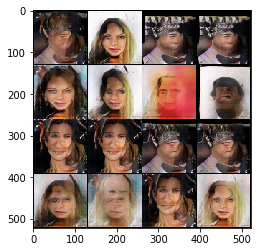

[0/1][750/4052]	Loss_D: 0.5937	Loss_G: 9.6328	D(x): 0.1363	D(G(z)): 0.9533 / 0.9959	XE Loss: 6.3393	KLD Loss: 0.3049	MSE Loss: 4.4412
[0/1][1000/4052]	Loss_D: 0.5636	Loss_G: 9.2092	D(x): 0.2226	D(G(z)): 0.9843 / 0.9941	XE Loss: 6.2514	KLD Loss: 0.3105	MSE Loss: 4.3835


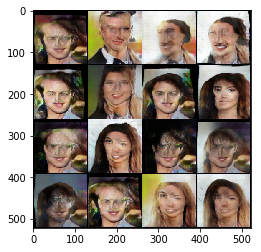

[0/1][1250/4052]	Loss_D: 0.5360	Loss_G: 9.5937	D(x): 0.2286	D(G(z)): 0.9934 / 0.9962	XE Loss: 6.1729	KLD Loss: 0.3045	MSE Loss: 4.3299
[0/1][1500/4052]	Loss_D: 0.5567	Loss_G: 10.0305	D(x): 0.2429	D(G(z)): 0.9920 / 0.9936	XE Loss: 6.0962	KLD Loss: 0.2986	MSE Loss: 4.2998


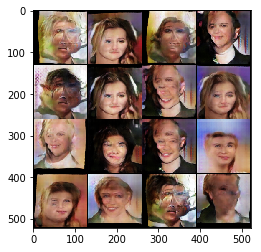

[0/1][1750/4052]	Loss_D: 0.5825	Loss_G: 10.7193	D(x): 0.1196	D(G(z)): 0.9658 / 0.9980	XE Loss: 6.0603	KLD Loss: 0.3167	MSE Loss: 4.3032
[0/1][2000/4052]	Loss_D: 0.5745	Loss_G: 9.0819	D(x): 0.2121	D(G(z)): 0.9527 / 0.9944	XE Loss: 6.0313	KLD Loss: 0.3135	MSE Loss: 4.2700


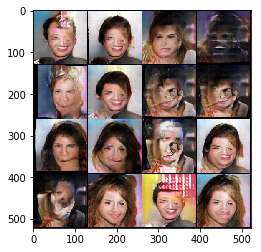

[0/1][2250/4052]	Loss_D: 0.5439	Loss_G: 10.2324	D(x): 0.1846	D(G(z)): 0.9938 / 0.9965	XE Loss: 5.9985	KLD Loss: 0.3117	MSE Loss: 4.2429
[0/1][2500/4052]	Loss_D: 0.6330	Loss_G: 7.0682	D(x): 0.3670	D(G(z)): 0.9843 / 0.9429	XE Loss: 5.9645	KLD Loss: 0.3110	MSE Loss: 4.2246


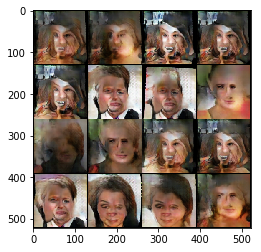

[0/1][2750/4052]	Loss_D: 0.5406	Loss_G: 9.2663	D(x): 0.2224	D(G(z)): 0.9875 / 0.9964	XE Loss: 5.9075	KLD Loss: 0.3073	MSE Loss: 4.2111
[0/1][3000/4052]	Loss_D: 0.6418	Loss_G: 14.2994	D(x): 0.3637	D(G(z)): 0.9999 / 0.9999	XE Loss: 5.8954	KLD Loss: 0.3017	MSE Loss: 4.1862


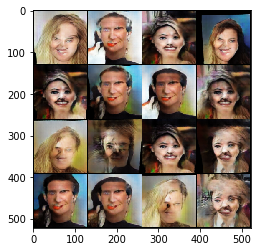

[0/1][3250/4052]	Loss_D: 0.5649	Loss_G: 9.0380	D(x): 0.1699	D(G(z)): 0.9553 / 0.9965	XE Loss: 5.8901	KLD Loss: 0.2964	MSE Loss: 4.1751
[0/1][3500/4052]	Loss_D: 0.5547	Loss_G: 9.7170	D(x): 0.2626	D(G(z)): 0.9938 / 0.9975	XE Loss: 5.8822	KLD Loss: 0.2978	MSE Loss: 4.1569


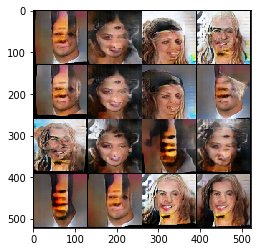

[0/1][3750/4052]	Loss_D: 0.5731	Loss_G: 9.6537	D(x): 0.1972	D(G(z)): 0.9710 / 0.9973	XE Loss: 5.8639	KLD Loss: 0.2946	MSE Loss: 4.1351
[0/1][4000/4052]	Loss_D: 0.5360	Loss_G: 9.1085	D(x): 0.1921	D(G(z)): 0.9901 / 0.9954	XE Loss: 5.8443	KLD Loss: 0.2939	MSE Loss: 4.1141


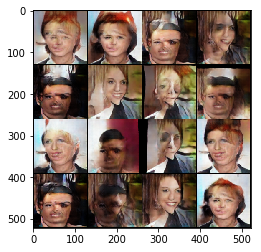

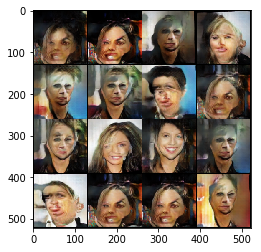

Epoch 0 G Loss: 10.236989535442815 D Loss: 0.5789545614857076 Test G Loss: 0.0 Test D Loss: 0.0 Test Real D: 0.0 Test Fake D: 0.0


In [0]:
train_gan_2(netD, netG, optimizerD, optimizerG, num_epochs=1)

Starting Training Loop...
[0/3][0/5403]	Loss_D: 0.4070	Loss_G: 14.7758	D(x): 0.1393	D(G(z)): 0.9366 / 0.9997	XE Loss: 8.3776	KLD Loss: 0.2343	MSE Loss: 6.1639
[0/3][250/5403]	Loss_D: 0.3724	Loss_G: 11.9701	D(x): 0.1606	D(G(z)): 0.9904 / 0.9932	XE Loss: 6.7067	KLD Loss: 0.2533	MSE Loss: 6.2206
[0/3][500/5403]	Loss_D: 0.3583	Loss_G: 11.9535	D(x): 0.0609	D(G(z)): 0.9919 / 0.9945	XE Loss: 6.3922	KLD Loss: 0.2486	MSE Loss: 6.3815
[0/3][750/5403]	Loss_D: 0.3602	Loss_G: 12.9501	D(x): 0.1531	D(G(z)): 0.9962 / 0.9973	XE Loss: 6.4707	KLD Loss: 0.2473	MSE Loss: 6.4436
[0/3][1000/5403]	Loss_D: 0.3443	Loss_G: 32.2965	D(x): 0.0952	D(G(z)): 1.0000 / 1.0000	XE Loss: 7.0756	KLD Loss: 0.2436	MSE Loss: 6.4643


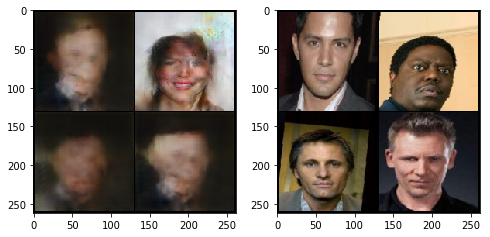

[0/3][1250/5403]	Loss_D: 0.3283	Loss_G: 30.0689	D(x): 0.0888	D(G(z)): 1.0000 / 1.0000	XE Loss: 11.1834	KLD Loss: 0.2157	MSE Loss: 5.7363
[0/3][1500/5403]	Loss_D: 0.3309	Loss_G: 30.3880	D(x): 0.1029	D(G(z)): 1.0000 / 1.0000	XE Loss: 13.8976	KLD Loss: 0.1960	MSE Loss: 5.1707
[0/3][1750/5403]	Loss_D: 0.3290	Loss_G: 29.6425	D(x): 0.1019	D(G(z)): 1.0000 / 1.0000	XE Loss: 15.8584	KLD Loss: 0.1811	MSE Loss: 4.7365
[0/3][2000/5403]	Loss_D: 0.3344	Loss_G: 13.2462	D(x): 0.0938	D(G(z)): 0.9965 / 0.9982	XE Loss: 15.2374	KLD Loss: 0.1847	MSE Loss: 4.7445


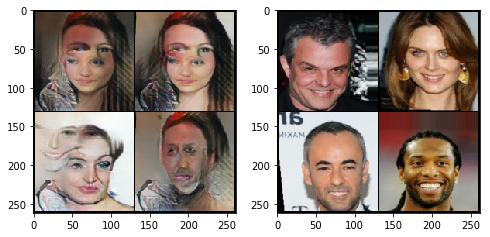

[0/3][2250/5403]	Loss_D: 0.3333	Loss_G: 16.3985	D(x): 0.0848	D(G(z)): 0.9994 / 0.9999	XE Loss: 14.3788	KLD Loss: 0.1916	MSE Loss: 4.8802
[0/3][2500/5403]	Loss_D: 0.4083	Loss_G: 16.4068	D(x): 0.0885	D(G(z)): 0.9388 / 0.9999	XE Loss: 13.7038	KLD Loss: 0.1986	MSE Loss: 4.9592
[0/3][2750/5403]	Loss_D: 0.3504	Loss_G: 14.4101	D(x): 0.0951	D(G(z)): 0.9879 / 0.9991	XE Loss: 13.0987	KLD Loss: 0.2051	MSE Loss: 5.0169
[0/3][3000/5403]	Loss_D: 0.4985	Loss_G: 20.7716	D(x): 0.0722	D(G(z)): 0.8594 / 1.0000	XE Loss: 12.6429	KLD Loss: 0.2094	MSE Loss: 5.0811


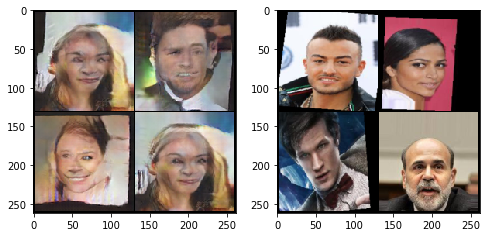

[0/3][3250/5403]	Loss_D: 0.3347	Loss_G: 15.3267	D(x): 0.1092	D(G(z)): 0.9995 / 0.9994	XE Loss: 12.1972	KLD Loss: 0.2143	MSE Loss: 5.1619
[0/3][3500/5403]	Loss_D: 0.3500	Loss_G: 12.5628	D(x): 0.0673	D(G(z)): 0.9977 / 0.9979	XE Loss: 11.8866	KLD Loss: 0.2179	MSE Loss: 5.2348
[0/3][3750/5403]	Loss_D: 0.3436	Loss_G: 14.2551	D(x): 0.0850	D(G(z)): 0.9978 / 0.9993	XE Loss: 11.5837	KLD Loss: 0.2204	MSE Loss: 5.3104
[0/3][4000/5403]	Loss_D: 0.3737	Loss_G: 10.8477	D(x): 0.1284	D(G(z)): 0.9838 / 0.9878	XE Loss: 11.2883	KLD Loss: 0.2228	MSE Loss: 5.3681


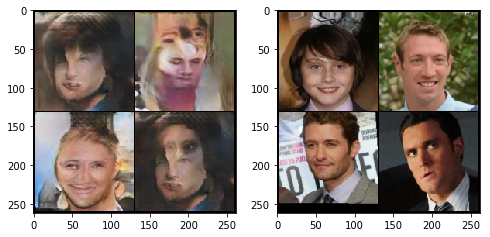

[0/3][4250/5403]	Loss_D: 0.3855	Loss_G: 12.5217	D(x): 0.0663	D(G(z)): 0.9573 / 0.9943	XE Loss: 11.0458	KLD Loss: 0.2245	MSE Loss: 5.4128
[0/3][4500/5403]	Loss_D: 0.4209	Loss_G: 10.4881	D(x): 0.1689	D(G(z)): 0.9543 / 0.9815	XE Loss: 10.8000	KLD Loss: 0.2260	MSE Loss: 5.4661
[0/3][4750/5403]	Loss_D: 0.3625	Loss_G: 12.7127	D(x): 0.0847	D(G(z)): 0.9822 / 0.9963	XE Loss: 10.5818	KLD Loss: 0.2276	MSE Loss: 5.5008
[0/3][5000/5403]	Loss_D: 0.3454	Loss_G: 13.1727	D(x): 0.1068	D(G(z)): 0.9947 / 0.9962	XE Loss: 10.3760	KLD Loss: 0.2299	MSE Loss: 5.5647


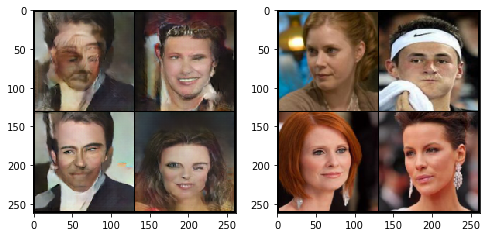

[0/3][5250/5403]	Loss_D: 0.3636	Loss_G: 14.0704	D(x): 0.0454	D(G(z)): 0.9927 / 0.9991	XE Loss: 10.2171	KLD Loss: 0.2315	MSE Loss: 5.6095


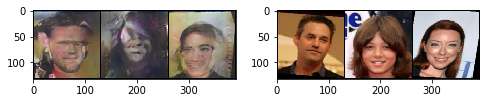

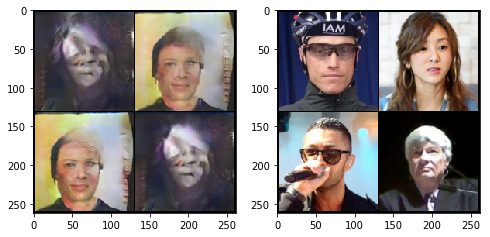

Epoch 0 G Loss: 15.998607685273386 D Loss: 0.3738805742621665 Test G Loss: 6.818429105770514 Test D Loss: 0.4670506118031269 Test Real D: 0.15687396088865727 Test Fake D: 0.5443040788420486
[1/3][0/5403]	Loss_D: 2.1207	Loss_G: 14.6045	D(x): 0.0239	D(G(z)): 0.2496 / 0.9977	XE Loss: 8.0128	KLD Loss: 0.2416	MSE Loss: 6.3501
[1/3][250/5403]	Loss_D: 0.4107	Loss_G: 13.5839	D(x): 0.2173	D(G(z)): 0.9997 / 0.9994	XE Loss: 5.7332	KLD Loss: 0.2453	MSE Loss: 5.7789
[1/3][500/5403]	Loss_D: 0.5374	Loss_G: 10.8338	D(x): 0.2554	D(G(z)): 0.9145 / 0.9893	XE Loss: 5.9791	KLD Loss: 0.2560	MSE Loss: 5.8778
[1/3][750/5403]	Loss_D: 0.3625	Loss_G: 11.6171	D(x): 0.1316	D(G(z)): 0.9869 / 0.9918	XE Loss: 5.9173	KLD Loss: 0.2567	MSE Loss: 5.9230
[1/3][1000/5403]	Loss_D: 0.3472	Loss_G: 12.7870	D(x): 0.1292	D(G(z)): 0.9943 / 0.9946	XE Loss: 5.9444	KLD Loss: 0.2593	MSE Loss: 5.9998


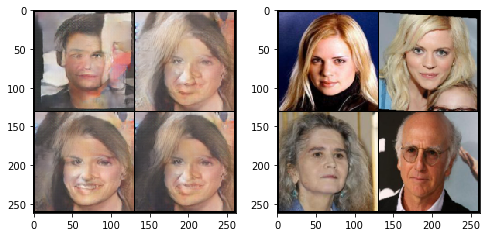

[1/3][1250/5403]	Loss_D: 0.3746	Loss_G: 13.1429	D(x): 0.2012	D(G(z)): 0.9980 / 0.9974	XE Loss: 6.0101	KLD Loss: 0.2549	MSE Loss: 6.0667
[1/3][1500/5403]	Loss_D: 0.3499	Loss_G: 13.1673	D(x): 0.1136	D(G(z)): 0.9881 / 0.9969	XE Loss: 6.0581	KLD Loss: 0.2506	MSE Loss: 6.1141
[1/3][1750/5403]	Loss_D: 0.3451	Loss_G: 14.4347	D(x): 0.0791	D(G(z)): 0.9993 / 0.9993	XE Loss: 6.1996	KLD Loss: 0.2480	MSE Loss: 6.1932
[1/3][2000/5403]	Loss_D: 0.3678	Loss_G: 12.4168	D(x): 0.1606	D(G(z)): 0.9885 / 0.9959	XE Loss: 6.2795	KLD Loss: 0.2462	MSE Loss: 6.2672


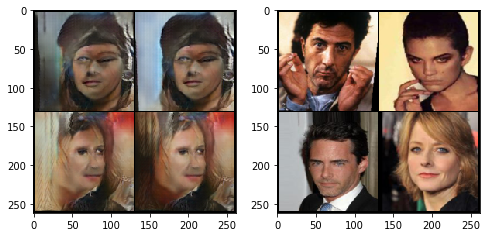

[1/3][2250/5403]	Loss_D: 0.3501	Loss_G: 11.9591	D(x): 0.0908	D(G(z)): 0.9865 / 0.9924	XE Loss: 6.3141	KLD Loss: 0.2431	MSE Loss: 6.3063
[1/3][2500/5403]	Loss_D: 0.3774	Loss_G: 12.4050	D(x): 0.0711	D(G(z)): 0.9838 / 0.9946	XE Loss: 6.3304	KLD Loss: 0.2422	MSE Loss: 6.3178
[1/3][2750/5403]	Loss_D: 0.3965	Loss_G: 12.7342	D(x): 0.2287	D(G(z)): 0.9990 / 0.9976	XE Loss: 6.3348	KLD Loss: 0.2427	MSE Loss: 6.3560
[1/3][3000/5403]	Loss_D: 0.7166	Loss_G: 8.1004	D(x): 0.4771	D(G(z)): 1.0000 / 0.7248	XE Loss: 6.4144	KLD Loss: 0.2425	MSE Loss: 6.3947


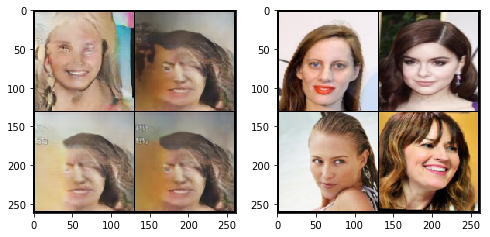

[1/3][3250/5403]	Loss_D: 0.3501	Loss_G: 13.1970	D(x): 0.0755	D(G(z)): 0.9967 / 0.9969	XE Loss: 6.4696	KLD Loss: 0.2407	MSE Loss: 6.4025
[1/3][3500/5403]	Loss_D: 0.3496	Loss_G: 13.5840	D(x): 0.0680	D(G(z)): 0.9917 / 0.9971	XE Loss: 6.5019	KLD Loss: 0.2410	MSE Loss: 6.4522
[1/3][3750/5403]	Loss_D: 0.3512	Loss_G: 14.1718	D(x): 0.1492	D(G(z)): 0.9982 / 0.9985	XE Loss: 6.5556	KLD Loss: 0.2412	MSE Loss: 6.4776
[1/3][4000/5403]	Loss_D: 0.3350	Loss_G: 14.8975	D(x): 0.1150	D(G(z)): 0.9992 / 0.9993	XE Loss: 6.5760	KLD Loss: 0.2406	MSE Loss: 6.4988


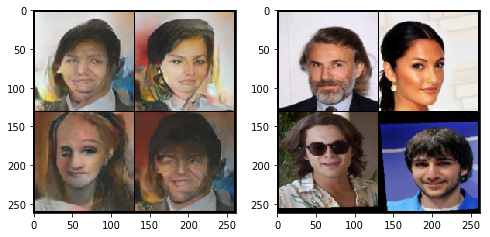

[1/3][4250/5403]	Loss_D: 0.3391	Loss_G: 14.1607	D(x): 0.0906	D(G(z)): 0.9931 / 0.9989	XE Loss: 6.6348	KLD Loss: 0.2404	MSE Loss: 6.5217
[1/3][4500/5403]	Loss_D: 0.3394	Loss_G: 13.7523	D(x): 0.1051	D(G(z)): 0.9925 / 0.9970	XE Loss: 6.6945	KLD Loss: 0.2398	MSE Loss: 6.5624
[1/3][4750/5403]	Loss_D: 0.3724	Loss_G: 13.6154	D(x): 0.1626	D(G(z)): 0.9801 / 0.9977	XE Loss: 6.7223	KLD Loss: 0.2396	MSE Loss: 6.5902
[1/3][5000/5403]	Loss_D: 0.3936	Loss_G: 10.4066	D(x): 0.1523	D(G(z)): 0.9827 / 0.9687	XE Loss: 6.7399	KLD Loss: 0.2402	MSE Loss: 6.6033


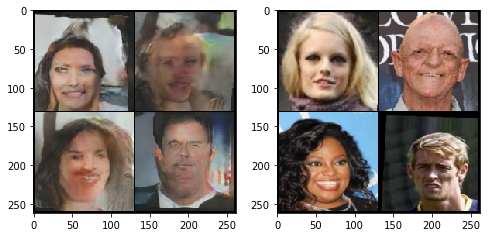

[1/3][5250/5403]	Loss_D: 0.3382	Loss_G: 14.4664	D(x): 0.0910	D(G(z)): 0.9974 / 0.9985	XE Loss: 6.7957	KLD Loss: 0.2403	MSE Loss: 6.6197


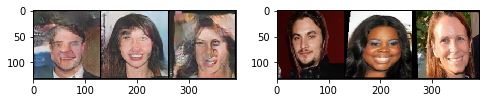

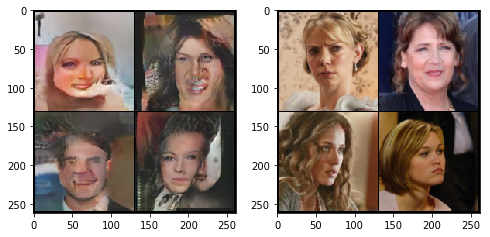

Epoch 1 G Loss: 13.673437810442788 D Loss: 0.37564720991980294 Test G Loss: 8.555610668585167 Test D Loss: 1.493837450632891 Test Real D: 0.3420149577823979 Test Fake D: 0.4699870667595794
[2/3][0/5403]	Loss_D: 1.9170	Loss_G: 11.1906	D(x): 0.0160	D(G(z)): 0.3366 / 0.9256	XE Loss: 3.8281	KLD Loss: 0.2672	MSE Loss: 7.0953
[2/3][250/5403]	Loss_D: 0.3682	Loss_G: 11.7491	D(x): 0.0742	D(G(z)): 0.9766 / 0.9952	XE Loss: 6.0821	KLD Loss: 0.2620	MSE Loss: 6.0880
[2/3][500/5403]	Loss_D: 0.3827	Loss_G: 12.8866	D(x): 0.0429	D(G(z)): 0.9842 / 0.9972	XE Loss: 6.4069	KLD Loss: 0.2698	MSE Loss: 6.2350
[2/3][750/5403]	Loss_D: 0.4375	Loss_G: 11.3355	D(x): 0.2609	D(G(z)): 0.9997 / 0.9801	XE Loss: 6.5879	KLD Loss: 0.2677	MSE Loss: 6.2582
[2/3][1000/5403]	Loss_D: 0.3630	Loss_G: 12.8474	D(x): 0.1627	D(G(z)): 0.9926 / 0.9938	XE Loss: 6.7026	KLD Loss: 0.2682	MSE Loss: 6.3453


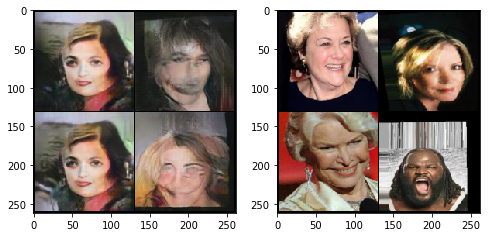

[2/3][1250/5403]	Loss_D: 0.3421	Loss_G: 12.7819	D(x): 0.1101	D(G(z)): 0.9945 / 0.9969	XE Loss: 6.7937	KLD Loss: 0.2689	MSE Loss: 6.4310
[2/3][1500/5403]	Loss_D: 0.3466	Loss_G: 12.7295	D(x): 0.0797	D(G(z)): 0.9892 / 0.9977	XE Loss: 6.8380	KLD Loss: 0.2668	MSE Loss: 6.4284
[2/3][1750/5403]	Loss_D: 0.3623	Loss_G: 14.5735	D(x): 0.0681	D(G(z)): 0.9784 / 0.9994	XE Loss: 6.8512	KLD Loss: 0.2633	MSE Loss: 6.4497
[2/3][2000/5403]	Loss_D: 0.3635	Loss_G: 11.0794	D(x): 0.1317	D(G(z)): 0.9795 / 0.9919	XE Loss: 6.8502	KLD Loss: 0.2610	MSE Loss: 6.4632


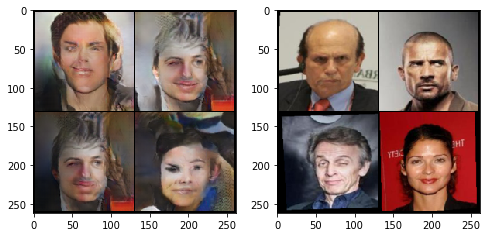

[2/3][2250/5403]	Loss_D: 0.3363	Loss_G: 12.5199	D(x): 0.1036	D(G(z)): 0.9962 / 0.9945	XE Loss: 6.8519	KLD Loss: 0.2589	MSE Loss: 6.4863
Interrupt


Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, b

Copying file://model_1g_vae.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/221.0 MiB.                                    
Copying file://model_1d_vae.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/82.5 MiB.                                     


In [0]:
train_gan_2(netD, netG, optimizerD, optimizerG, num_epochs=3, test_loader=test_loader)

Starting Training Loop...
[0/1][0/5605]	Loss_D: 7.6912	Loss_G: 1.0260	D(x): 0.9968	D(G(z)): 0.1555 / 0.6169
[0/1][100/5605]	Loss_D: 0.7382	Loss_G: 3.4988	D(x): 0.2914	D(G(z)): 0.9286 / 0.9664
[0/1][200/5605]	Loss_D: 0.7450	Loss_G: 4.2295	D(x): 0.2387	D(G(z)): 0.9245 / 0.9885
[0/1][300/5605]	Loss_D: 0.5862	Loss_G: 5.5914	D(x): 0.2180	D(G(z)): 0.9973 / 0.9967
[0/1][400/5605]	Loss_D: 0.5872	Loss_G: 4.2660	D(x): 0.2377	D(G(z)): 0.9821 / 0.9895
[0/1][500/5605]	Loss_D: 0.6054	Loss_G: 4.6159	D(x): 0.2469	D(G(z)): 0.9886 / 0.9929


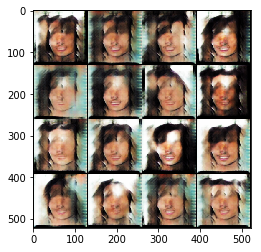

Interrupt


Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, b

Copying file://model_1g_vae.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

-
Operation completed over 1 objects/221.0 MiB.                                    
Copying file://model_1d_vae.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/82.5 MiB.                                     


In [0]:
train_gan_s(netD, netG, optimizerD, optimizerDecoder, num_epochs=1)

Starting Training Loop...
[0/3][0/5605]	Loss_D: 0.3588	Loss_G: 11.7503	D(x): 0.1745	D(G(z)): 0.9980 / 0.9846	XE Loss: 4.6170	KLD Loss: 0.0999	MSE Loss: 7.0334
[0/3][250/5605]	Loss_D: 0.7055	Loss_G: 7.8433	D(x): 0.3642	D(G(z)): 0.8886 / 0.9828	XE Loss: 7.0473	KLD Loss: 0.1184	MSE Loss: 4.1577
[0/3][500/5605]	Loss_D: 0.3493	Loss_G: 9.7311	D(x): 0.1263	D(G(z)): 0.9912 / 0.9907	XE Loss: 6.5215	KLD Loss: 0.1512	MSE Loss: 4.0876
[0/3][750/5605]	Loss_D: 0.3772	Loss_G: 9.8080	D(x): 0.1879	D(G(z)): 0.9956 / 0.9890	XE Loss: 6.5334	KLD Loss: 0.1696	MSE Loss: 4.1513
[0/3][1000/5605]	Loss_D: 0.3849	Loss_G: 9.0715	D(x): 0.1899	D(G(z)): 0.9920 / 0.9728	XE Loss: 6.7192	KLD Loss: 0.1792	MSE Loss: 4.2148


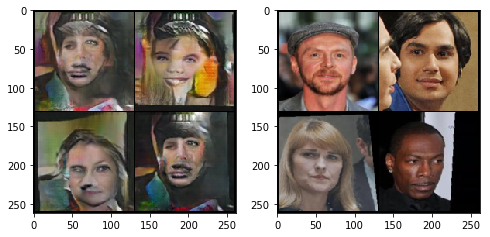

[0/3][1250/5605]	Loss_D: 0.6632	Loss_G: 29.6886	D(x): 0.4350	D(G(z)): 1.0000 / 1.0000	XE Loss: 10.6545	KLD Loss: 0.1667	MSE Loss: 3.8964
[0/3][1500/5605]	Loss_D: 0.8404	Loss_G: 29.4676	D(x): 0.5147	D(G(z)): 1.0000 / 1.0000	XE Loss: 13.4820	KLD Loss: 0.1540	MSE Loss: 3.5467
[0/3][1750/5605]	Loss_D: 1.0671	Loss_G: 29.3169	D(x): 0.6235	D(G(z)): 1.0000 / 1.0000	XE Loss: 15.5021	KLD Loss: 0.1450	MSE Loss: 3.2635
[0/3][2000/5605]	Loss_D: 0.7893	Loss_G: 29.0872	D(x): 0.5162	D(G(z)): 1.0000 / 1.0000	XE Loss: 17.0175	KLD Loss: 0.1383	MSE Loss: 3.0366


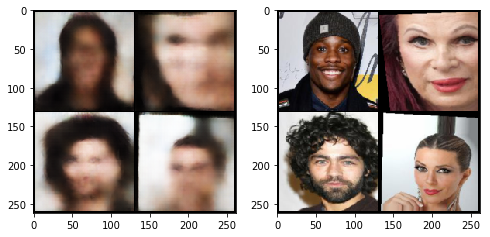

[0/3][2250/5605]	Loss_D: 0.3565	Loss_G: 12.9367	D(x): 0.0608	D(G(z)): 0.9957 / 0.9954	XE Loss: 18.1039	KLD Loss: 0.1334	MSE Loss: 2.8648
[0/3][2500/5605]	Loss_D: 0.3842	Loss_G: 11.9612	D(x): 0.0680	D(G(z)): 0.9594 / 0.9973	XE Loss: 16.9781	KLD Loss: 0.1419	MSE Loss: 3.0732
[0/3][2750/5605]	Loss_D: 0.3398	Loss_G: 12.2980	D(x): 0.0814	D(G(z)): 0.9960 / 0.9975	XE Loss: 16.0701	KLD Loss: 0.1504	MSE Loss: 3.3081
[0/3][3000/5605]	Loss_D: 0.3588	Loss_G: 11.7139	D(x): 0.1312	D(G(z)): 0.9943 / 0.9970	XE Loss: 15.3150	KLD Loss: 0.1561	MSE Loss: 3.4744


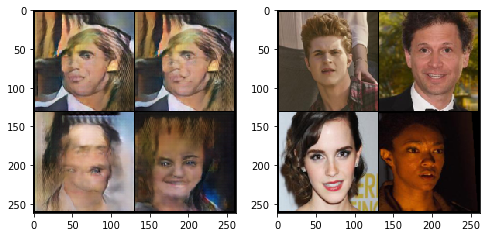

[0/3][3250/5605]	Loss_D: 0.3687	Loss_G: 32.7358	D(x): 0.1854	D(G(z)): 1.0000 / 1.0000	XE Loss: 14.6740	KLD Loss: 0.1618	MSE Loss: 3.6236
[0/3][3500/5605]	Loss_D: 0.3452	Loss_G: 12.5551	D(x): 0.0687	D(G(z)): 0.9970 / 0.9983	XE Loss: 14.1382	KLD Loss: 0.1665	MSE Loss: 3.7521
[0/3][3750/5605]	Loss_D: 0.3563	Loss_G: 15.1754	D(x): 0.0560	D(G(z)): 0.9998 / 0.9998	XE Loss: 13.6844	KLD Loss: 0.1707	MSE Loss: 3.8820
[0/3][4000/5605]	Loss_D: 0.3481	Loss_G: 13.7986	D(x): 0.0698	D(G(z)): 0.9912 / 0.9994	XE Loss: 13.3094	KLD Loss: 0.1748	MSE Loss: 4.0326


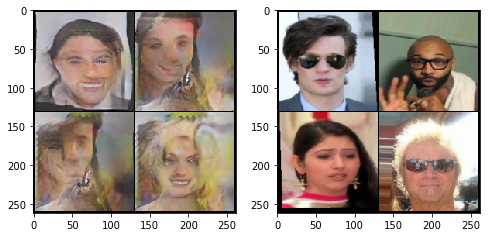

[0/3][4250/5605]	Loss_D: 0.3443	Loss_G: 13.6526	D(x): 0.1422	D(G(z)): 0.9973 / 0.9974	XE Loss: 12.9490	KLD Loss: 0.1776	MSE Loss: 4.1653
[0/3][4500/5605]	Loss_D: 0.3506	Loss_G: 13.8999	D(x): 0.1526	D(G(z)): 0.9996 / 0.9988	XE Loss: 12.6317	KLD Loss: 0.1815	MSE Loss: 4.2690
[0/3][4750/5605]	Loss_D: 0.3447	Loss_G: 29.9883	D(x): 0.1096	D(G(z)): 1.0000 / 1.0000	XE Loss: 12.9825	KLD Loss: 0.1815	MSE Loss: 4.2855
[0/3][5000/5605]	Loss_D: 0.4083	Loss_G: 29.4249	D(x): 0.2357	D(G(z)): 1.0000 / 1.0000	XE Loss: 13.7145	KLD Loss: 0.1770	MSE Loss: 4.1711


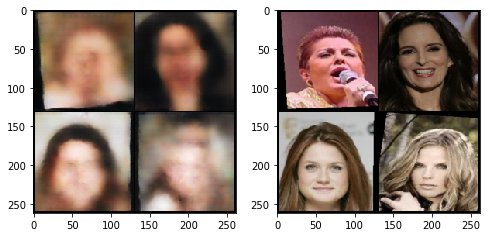

[0/3][5250/5605]	Loss_D: 0.5318	Loss_G: 29.3394	D(x): 0.1358	D(G(z)): 1.0000 / 1.0000	XE Loss: 14.3756	KLD Loss: 0.1729	MSE Loss: 4.0514
[0/3][5500/5605]	Loss_D: 0.6067	Loss_G: 29.3296	D(x): 0.1502	D(G(z)): 1.0000 / 1.0000	XE Loss: 14.9780	KLD Loss: 0.1692	MSE Loss: 3.9364


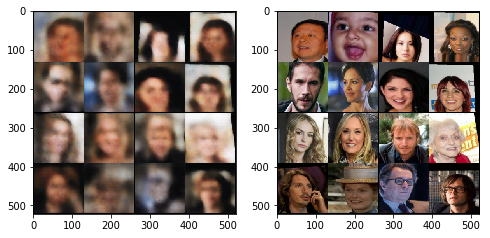

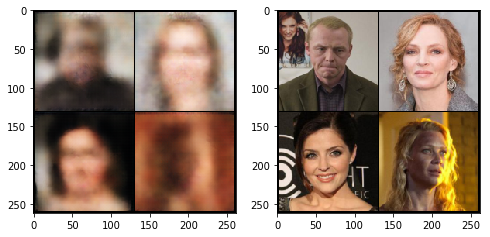

Epoch 0 G Loss: 19.271139063056722 D Loss: 0.517453646324874 Test G Loss: 17.659408521560344 Test D Loss: 5.048474672021344 Test Real D: 0.9995021808583842 Test Fake D: 0.9999992413327873
[1/3][0/5605]	Loss_D: 0.5408	Loss_G: 29.2757	D(x): 0.1410	D(G(z)): 1.0000 / 1.0000	XE Loss: 27.6310	KLD Loss: 0.0910	MSE Loss: 1.5536
Interrupt
Copying file://model_1g_vae.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on c

In [12]:
train_gan_2(netD, netG, optimizerD, optimizerG, num_epochs=3, test_loader=test_loader)

Starting Training Loop...
[0/3][0/5605]	Loss_D: 0.7016	Loss_G: 26.0527	D(x): 0.2370	D(G(z)): 1.0000 / 1.0000	XE Loss: 24.8679	KLD Loss: 0.0906	MSE Loss: 1.0942
[0/3][250/5605]	Loss_D: 0.5043	Loss_G: 20.8788	D(x): 0.1914	D(G(z)): 1.0000 / 1.0000	XE Loss: 24.8202	KLD Loss: 0.0810	MSE Loss: 1.1439
[0/3][500/5605]	Loss_D: 0.5638	Loss_G: 9.8856	D(x): 0.1167	D(G(z)): 0.9781 / 0.9959	XE Loss: 15.3494	KLD Loss: 0.1488	MSE Loss: 2.4164
[0/3][750/5605]	Loss_D: 0.5146	Loss_G: 11.9599	D(x): 0.2157	D(G(z)): 0.9978 / 0.9992	XE Loss: 12.2096	KLD Loss: 0.1732	MSE Loss: 3.1371
[0/3][1000/5605]	Loss_D: 0.5164	Loss_G: 11.8682	D(x): 0.1710	D(G(z)): 0.9992 / 0.9993	XE Loss: 10.7725	KLD Loss: 0.1858	MSE Loss: 3.5561


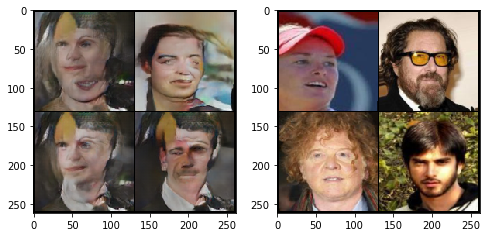

[0/3][1250/5605]	Loss_D: 0.5145	Loss_G: 11.9127	D(x): 0.2339	D(G(z)): 0.9977 / 0.9986	XE Loss: 9.8664	KLD Loss: 0.1953	MSE Loss: 3.8571
[0/3][1500/5605]	Loss_D: 0.5457	Loss_G: 13.8573	D(x): 0.1116	D(G(z)): 0.9984 / 0.9999	XE Loss: 9.2193	KLD Loss: 0.2013	MSE Loss: 4.0325
[0/3][1750/5605]	Loss_D: 0.5207	Loss_G: 14.8722	D(x): 0.1544	D(G(z)): 0.9998 / 1.0000	XE Loss: 8.7729	KLD Loss: 0.2080	MSE Loss: 4.2048
[0/3][2000/5605]	Loss_D: 0.5174	Loss_G: 11.9560	D(x): 0.1576	D(G(z)): 0.9962 / 0.9992	XE Loss: 8.4100	KLD Loss: 0.2136	MSE Loss: 4.2967


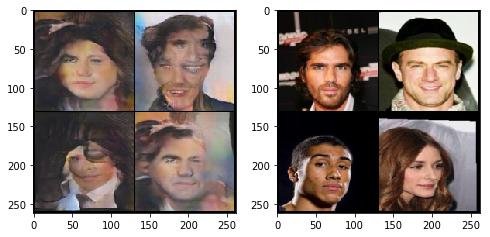

[0/3][2250/5605]	Loss_D: 0.5320	Loss_G: 11.9572	D(x): 0.1429	D(G(z)): 0.9961 / 0.9994	XE Loss: 8.1022	KLD Loss: 0.2161	MSE Loss: 4.3694
[0/3][2500/5605]	Loss_D: 0.5492	Loss_G: 10.9641	D(x): 0.2237	D(G(z)): 0.9643 / 0.9968	XE Loss: 7.9174	KLD Loss: 0.2181	MSE Loss: 4.4383
[0/3][2750/5605]	Loss_D: 0.5181	Loss_G: 11.5856	D(x): 0.2428	D(G(z)): 0.9921 / 0.9960	XE Loss: 7.7325	KLD Loss: 0.2201	MSE Loss: 4.5228
[0/3][3000/5605]	Loss_D: 0.5147	Loss_G: 12.5205	D(x): 0.1573	D(G(z)): 0.9956 / 0.9986	XE Loss: 7.6065	KLD Loss: 0.2210	MSE Loss: 4.6046


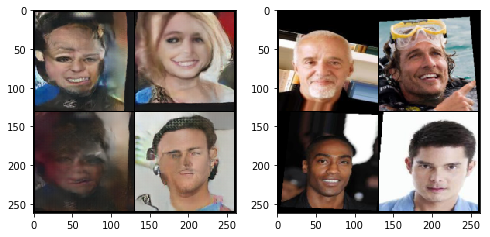

[0/3][3250/5605]	Loss_D: 0.5294	Loss_G: 11.2246	D(x): 0.2670	D(G(z)): 0.9979 / 0.9963	XE Loss: 7.5043	KLD Loss: 0.2211	MSE Loss: 4.6598
[0/3][3500/5605]	Loss_D: 0.5338	Loss_G: 10.4527	D(x): 0.2753	D(G(z)): 0.9935 / 0.9953	XE Loss: 7.3988	KLD Loss: 0.2218	MSE Loss: 4.7121
[0/3][3750/5605]	Loss_D: 0.5271	Loss_G: 14.7253	D(x): 0.1301	D(G(z)): 0.9997 / 0.9999	XE Loss: 7.2943	KLD Loss: 0.2220	MSE Loss: 4.7469
[0/3][4000/5605]	Loss_D: 0.7455	Loss_G: 7.7655	D(x): 0.4808	D(G(z)): 0.9997 / 0.8474	XE Loss: 7.2033	KLD Loss: 0.2224	MSE Loss: 4.7834


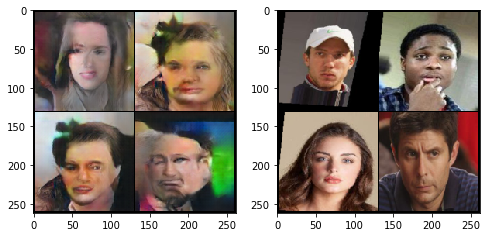

[0/3][4250/5605]	Loss_D: 0.5277	Loss_G: 13.6938	D(x): 0.2745	D(G(z)): 0.9999 / 0.9998	XE Loss: 7.1587	KLD Loss: 0.2250	MSE Loss: 4.8370
[0/3][4500/5605]	Loss_D: 0.5612	Loss_G: 10.2099	D(x): 0.2930	D(G(z)): 0.9904 / 0.9953	XE Loss: 7.1306	KLD Loss: 0.2266	MSE Loss: 4.8632
[0/3][4750/5605]	Loss_D: 0.5115	Loss_G: 12.6058	D(x): 0.1878	D(G(z)): 0.9985 / 0.9990	XE Loss: 7.0867	KLD Loss: 0.2274	MSE Loss: 4.8955
[0/3][5000/5605]	Loss_D: 0.5154	Loss_G: 12.4039	D(x): 0.2405	D(G(z)): 0.9994 / 0.9992	XE Loss: 7.0539	KLD Loss: 0.2287	MSE Loss: 4.9272


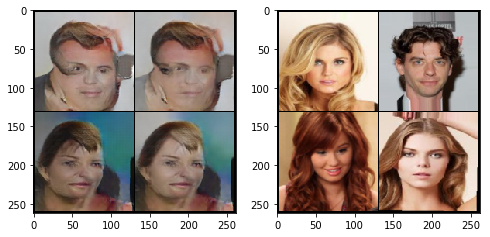

[0/3][5250/5605]	Loss_D: 0.5199	Loss_G: 13.3280	D(x): 0.1561	D(G(z)): 0.9937 / 0.9992	XE Loss: 7.0364	KLD Loss: 0.2295	MSE Loss: 4.9626
[0/3][5500/5605]	Loss_D: 0.5102	Loss_G: 12.4800	D(x): 0.2379	D(G(z)): 0.9975 / 0.9983	XE Loss: 7.0397	KLD Loss: 0.2309	MSE Loss: 4.9999


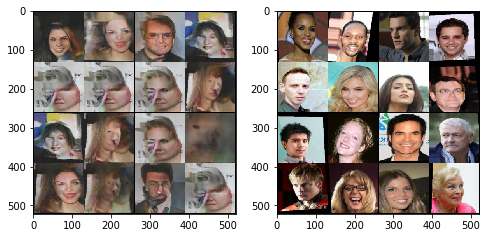

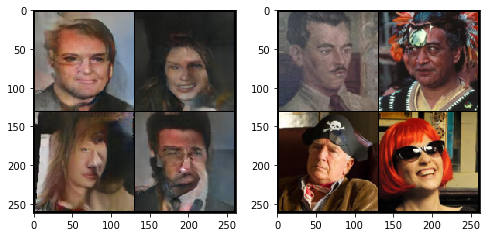

Epoch 0 G Loss: 12.27795651535388 D Loss: 0.5319725473792717 Test G Loss: 7.268854357144277 Test D Loss: 0.8585974360189915 Test Real D: 0.26168819951873296 Test Fake D: 0.8402327859562486
[1/3][0/5605]	Loss_D: 0.5105	Loss_G: 12.3852	D(x): 0.2162	D(G(z)): 0.9941 / 0.9984	XE Loss: 6.0965	KLD Loss: 0.2566	MSE Loss: 6.0321
[1/3][250/5605]	Loss_D: 0.5079	Loss_G: 12.2805	D(x): 0.2199	D(G(z)): 0.9977 / 0.9989	XE Loss: 8.4650	KLD Loss: 0.2429	MSE Loss: 5.6792
[1/3][500/5605]	Loss_D: 0.5570	Loss_G: 9.9891	D(x): 0.2914	D(G(z)): 0.9883 / 0.9924	XE Loss: 7.7523	KLD Loss: 0.2393	MSE Loss: 5.5662
[1/3][750/5605]	Loss_D: 0.5188	Loss_G: 11.4586	D(x): 0.2449	D(G(z)): 0.9967 / 0.9982	XE Loss: 7.1574	KLD Loss: 0.2349	MSE Loss: 5.3424
[1/3][1000/5605]	Loss_D: 0.5468	Loss_G: 9.0320	D(x): 0.2251	D(G(z)): 0.9727 / 0.9900	XE Loss: 6.8712	KLD Loss: 0.2371	MSE Loss: 5.2097


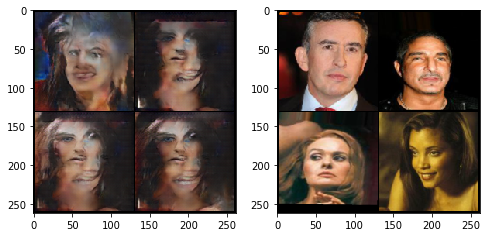

[1/3][1250/5605]	Loss_D: 0.5222	Loss_G: 10.4450	D(x): 0.2014	D(G(z)): 0.9863 / 0.9979	XE Loss: 6.5840	KLD Loss: 0.2381	MSE Loss: 5.1123
[1/3][1500/5605]	Loss_D: 0.5220	Loss_G: 11.7841	D(x): 0.1508	D(G(z)): 0.9955 / 0.9983	XE Loss: 6.4921	KLD Loss: 0.2420	MSE Loss: 5.0990
[1/3][1750/5605]	Loss_D: 0.5292	Loss_G: 10.0812	D(x): 0.2727	D(G(z)): 0.9948 / 0.9874	XE Loss: 6.4967	KLD Loss: 0.2453	MSE Loss: 5.1297
[1/3][2000/5605]	Loss_D: 0.5230	Loss_G: 11.1622	D(x): 0.2575	D(G(z)): 0.9971 / 0.9982	XE Loss: 6.6315	KLD Loss: 0.2452	MSE Loss: 5.1282


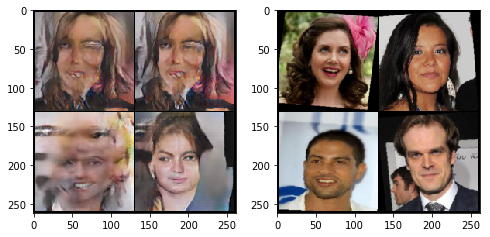

Interrupt


Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, b

Copying file://model_1g_vae.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/221.0 MiB.                                    
Copying file://model_1d_vae.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/82.5 MiB.                                     


In [15]:
train_gan_2(netD, netG, optimizerD, optimizerG, num_epochs=3, test_loader=test_loader)

In [0]:
train_gan_2(netD, netG, optimizerD, optimizerG, num_epochs=3, test_loader=test_loader)

Starting Training Loop...
[0/3][0/5605]	Loss_D: 0.3567	Loss_G: 13.7428	D(x): 0.1496	D(G(z)): 0.9891 / 0.9996	XE Loss: 8.2471	KLD Loss: 0.2405	MSE Loss: 5.2552
[0/3][250/5605]	Loss_D: 0.3271	Loss_G: 30.0478	D(x): 0.0936	D(G(z)): 1.0000 / 1.0000	XE Loss: 20.9574	KLD Loss: 0.1935	MSE Loss: 4.1413
[0/3][500/5605]	Loss_D: 0.3276	Loss_G: 29.3382	D(x): 0.0905	D(G(z)): 1.0000 / 1.0000	XE Loss: 24.2875	KLD Loss: 0.1368	MSE Loss: 3.0261
[0/3][750/5605]	Loss_D: 0.3272	Loss_G: 29.2351	D(x): 0.0907	D(G(z)): 1.0000 / 1.0000	XE Loss: 25.3432	KLD Loss: 0.1224	MSE Loss: 2.5775


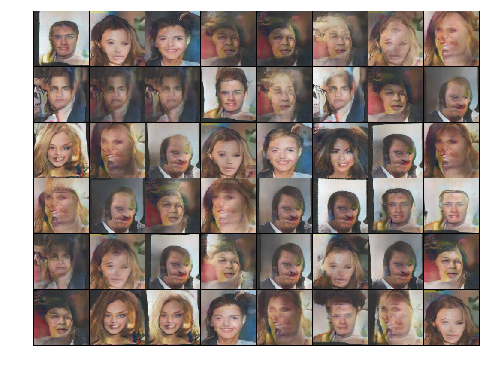

In [0]:
from IPython.display import HTML
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

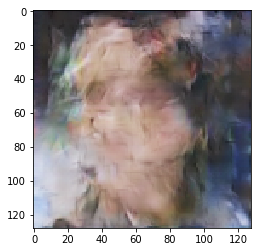

tensor(2.5272e-05) tensor(0.9838)


In [0]:
fake = netG.decoder(fixed_noise).detach().cpu()
fake = (fake * 0.5) + 0.5
plt.imshow(fake[0].permute(1,2,0))
plt.show()
print(fake.min(), fake.max())

In [0]:
g_save_path = "model_1g.pt"
d_save_path = "model_1d.pt"

torch.save(netG.state_dict(), g_save_path)
torch.save(netD.state_dict(), d_save_path)

!gsutil cp {g_save_path} gs://{bucket_name}/{g_save_path}
!gsutil cp {d_save_path} gs://{bucket_name}/{d_save_path}

Copying file://model_1g.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/74.6 MiB.                                     
Copying file://model_1d.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/82.5 MiB.                                     


Accuracy: tensor(0.5833, device='cuda:0')
0.7824792861938477


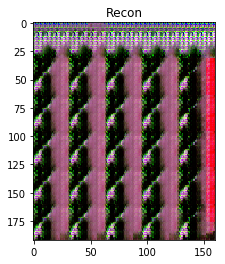

0.5986606478691101


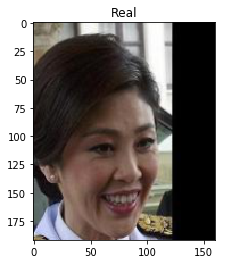

In [0]:
# check that the discriminator is working properly
with torch.no_grad():
    for (inputs, _) in train_loader:
        generator.eval()
        batch_size = inputs.shape[0]
        
        noise = torch.randn(batch_size, latent_dim, 1, 1).cuda()
        recon = generator(noise)
        
        # feed the original images to the discriminator
        real_probs = torch.sigmoid(discriminator(inputs.cuda()))
        fake_probs = torch.sigmoid(discriminator(recon))
        
        probs = torch.cat((real_probs, fake_probs), 0).float()
        labels = torch.cat((torch.zeros(batch_size), torch.ones(batch_size)), 0).cuda()
        
        print("Accuracy:", torch.mean((torch.round(probs) == labels).float()))
        print(fake_probs[0].item())
        plt.imshow(recon[0].cpu().permute(1,2,0))
        plt.title("Recon")
        plt.show()
        
        print(real_probs[0].item())
        plt.imshow(inputs[0].cpu().permute(1,2,0))
        plt.title("Real")
        plt.show()
        
        break

In [0]:
for (image, label) in zip(disc_batch, d_preds):
    plt.imshow(image.detach().cpu().permute(1, 2, 0))
    plt.title(str(label))
    plt.show()

In [0]:
inputs = torch.autograd.Variable(recon.clone().cuda(), requires_grad=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


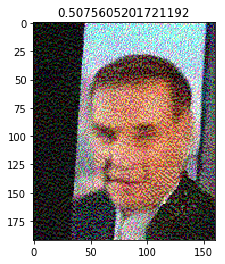

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


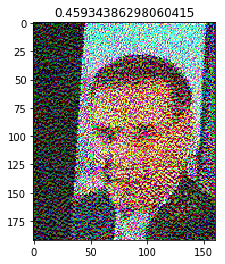

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


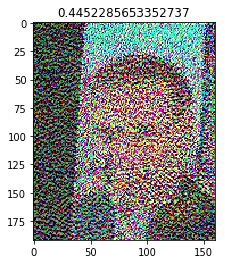

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


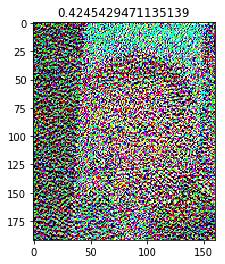

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


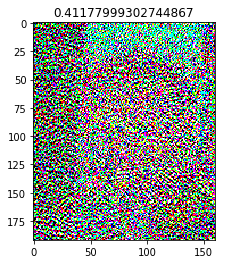

KeyboardInterrupt: ignored

In [0]:
# create a random tensor of the proper size
# inputs = torch.autograd.Variable(torch.randn(2, 3, 192, 160).cuda(), requires_grad=True)

# create an optimizer for our images
r_opt = optim.Adam([inputs], lr=0.001)

# loss function is we want the images to be predicted as real
def rev_loss(d_faked):
    labels = torch.ones(d_faked.shape[0]).cuda()
#     labels = torch.zeros(d_faked.shape[0]).cuda()
    d_loss = nn.functional.binary_cross_entropy_with_logits(d_faked, labels, reduction="mean")
    
    return d_loss

# discriminator.eval()  
  
for j in range(10):  
  losses = []
  for i in range(200):
      logits = discriminator(inputs)
      loss = rev_loss(logits)
#       print(loss.item())
      loss.backward()
      r_opt.step()
      losses.append(loss.item())
      
  plt.imshow(inputs[0].detach().cpu().permute(1, 2, 0) )
  plt.title(str(np.mean(losses)))
  plt.show()

In [0]:
## CHECK MEAN AND VARIANCE OF CODES
with torch.no_grad():
    for (inputs, _) in test_loader:
      generator.encoder.eval()
      generator.decoder.eval()
      # encode the images and reconstruct them
      codes, logvar = generator.encoder(inputs.cuda())
      print("Mean:", torch.mean(codes))
      print("Std:", codes.std())
      recon = generator.decoder(codes)
      d_faked = discriminator(recon)
      print("Faked Logits Mean:", d_faked.mean())
      vae_loss(inputs.cuda(), recon, codes, logvar=logvar, d_faked = d_faked, debug = True)
      break

Mean: tensor(-0.0188, device='cuda:0')
Std: tensor(3.1603, device='cuda:0')
Faked Logits Mean: tensor(0.0726, device='cuda:0')
MSE Loss Raw: tensor(0.0024, device='cuda:0')
MSE Loss Weighted: tensor(0.4753, device='cuda:0')
KLD Loss Raw: tensor([0.])
KLD Loss Weighted: tensor([0.])
Disc Loss Raw: tensor(0.7382, device='cuda:0')
Disc Loss Weighted: tensor(0.1476, device='cuda:0')
Total Loss (weighted): tensor(0.6230, device='cuda:0')


#### Additional Training on Personal Images

In [0]:
!mkdir data/Train
!cp -r data/images/Training_Pictures data/Train/Images

In [0]:
train_dataset2 = torchvision.datasets.ImageFolder(
        root="data/Train",
        transform=transform
    )

train_loader2 = torch.utils.data.DataLoader(
    train_dataset2,
    batch_size=BATCH_SIZE,
    num_workers=2,
    shuffle=True
)

In [0]:
# resume training the discriminator as well
train_gan(discriminator, generator, train_loader2, d_optimizer, g_optimizer, print_metrics=1000, plot_images=2000, num_epochs=51, extra_gen_train=1024, test_loader=None, separate_batches=True, g_scheduler=g_scheduler, d_scheduler=d_scheduler, d_save_path="disc_model_3.pt", g_save_path="gen_model_3.pt")

NameError: ignored

In [0]:
noise = np.random.normal(loc=0.3, scale=7.5, size=4096).reshape((1,4096,1,1))
image = model.decoder(torch.from_numpy(noise).cuda().float())
plt.imshow(image[0].cpu().detach().permute(1,2,0))
plt.show()

#### Additional Training on Specific Images

In [0]:
# # download and unzip the data
# url = "https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/GWB_64x64.zip"
# if not os.path.exists("gwb_images.zip"):
#   wget.download(url, 'gwb_images.zip')

#   zip_ref = zipfile.ZipFile('gwb_images.zip', 'r')
#   zip_ref.extractall('data/gwb')
#   zip_ref.close()

In [0]:
# use the existing encoder to create a GWBush decoder
from torch import optim
import numpy as np

  ## YOUR CODE HERE ##
encoder = model.encoder
gwb_decoder = Decoder(2048)
gwb_model = SingleModel(encoder, gwb_decoder)
gwb_params = gwb_model.decoder.parameters()

# run on GPU
use_cuda = True

if use_cuda and torch.cuda.is_available():
    encoder.cuda()
    gwb_decoder.cuda()
    gwb_model.cuda()
    
optimizer = optim.Adam(gwb_params, lr=0.002)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)    

In [0]:
# gwb dataset
BATCH_SIZE = 64
data_path = "data/gwb"

transform = torchvision.transforms.Compose(
    [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
      torchvision.transforms.RandomChoice([
        torchvision.transforms.RandomAffine(degrees=7, translate=(0.05,0.05), scale=(0.9,1.1), shear=3, resample=False, fillcolor=0),
        torchvision.transforms.RandomResizedCrop((192,160), scale=(0.90, 1.1)),
      ]),
    torchvision.transforms.ToTensor(),
    ])

gwb_train_dataset = torchvision.datasets.ImageFolder(
        root=data_path,
        transform=transform
    )

gwb_train_loader2 = torch.utils.data.DataLoader(
    gwb_train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True
)

In [0]:
for (images, _) in gwb_train_loader2:
  plt.imshow(images[0].permute(1,2,0))
  break

In [0]:
train(gwb_model, gwb_train_loader2, optimizer, print_metrics=0, num_epochs=200, display_images=20, scheduler=scheduler, save_path="./gwb_model.pt")